In [232]:
#implementing a multi layer perceptron to build a character level language model
#paper link: https://www.jmlr.org/papers/volume3/bengio03a/bengio03a.pdf

In [353]:
import torch

In [354]:
words = open('names.txt', 'r').read().splitlines()

In [355]:
words

['emma',
 'olivia',
 'ava',
 'isabella',
 'sophia',
 'charlotte',
 'mia',
 'amelia',
 'harper',
 'evelyn',
 'abigail',
 'emily',
 'elizabeth',
 'mila',
 'ella',
 'avery',
 'sofia',
 'camila',
 'aria',
 'scarlett',
 'victoria',
 'madison',
 'luna',
 'grace',
 'chloe',
 'penelope',
 'layla',
 'riley',
 'zoey',
 'nora',
 'lily',
 'eleanor',
 'hannah',
 'lillian',
 'addison',
 'aubrey',
 'ellie',
 'stella',
 'natalie',
 'zoe',
 'leah',
 'hazel',
 'violet',
 'aurora',
 'savannah',
 'audrey',
 'brooklyn',
 'bella',
 'claire',
 'skylar',
 'lucy',
 'paisley',
 'everly',
 'anna',
 'caroline',
 'nova',
 'genesis',
 'emilia',
 'kennedy',
 'samantha',
 'maya',
 'willow',
 'kinsley',
 'naomi',
 'aaliyah',
 'elena',
 'sarah',
 'ariana',
 'allison',
 'gabriella',
 'alice',
 'madelyn',
 'cora',
 'ruby',
 'eva',
 'serenity',
 'autumn',
 'adeline',
 'hailey',
 'gianna',
 'valentina',
 'isla',
 'eliana',
 'quinn',
 'nevaeh',
 'ivy',
 'sadie',
 'piper',
 'lydia',
 'alexa',
 'josephine',
 'emery',
 'julia'

In [236]:
chars = sorted(list(set(''.join(words))))

atoi = {ch: i+1 for i, ch in enumerate(chars)}
atoi['.'] = 0

itoa = {i: ch for ch, i in atoi.items()}

In [237]:
w = 'emma'
for i in w+'.':
    print(i)

e
m
m
a
.


In [238]:
#making the dataset
block_size = 3   #context length, the number of chars it needs to predict the next char
X, Y = [], []

for w in words[:5]:
    context = [0] * block_size
    print(w)
    for ch in (w+'.'):
        ix = atoi[ch]
        X.append(context)
        Y.append(ix)
        print(''.join(itoa[i] for i in context), '-->', ch)
        context = context[1:] + [ix]

X = torch.tensor(X)
Y = torch.tensor(Y)

emma
... --> e
..e --> m
.em --> m
emm --> a
mma --> .
olivia
... --> o
..o --> l
.ol --> i
oli --> v
liv --> i
ivi --> a
via --> .
ava
... --> a
..a --> v
.av --> a
ava --> .
isabella
... --> i
..i --> s
.is --> a
isa --> b
sab --> e
abe --> l
bel --> l
ell --> a
lla --> .
sophia
... --> s
..s --> o
.so --> p
sop --> h
oph --> i
phi --> a
hia --> .


In [239]:
X


tensor([[ 0,  0,  0],
        [ 0,  0,  5],
        [ 0,  5, 13],
        [ 5, 13, 13],
        [13, 13,  1],
        [ 0,  0,  0],
        [ 0,  0, 15],
        [ 0, 15, 12],
        [15, 12,  9],
        [12,  9, 22],
        [ 9, 22,  9],
        [22,  9,  1],
        [ 0,  0,  0],
        [ 0,  0,  1],
        [ 0,  1, 22],
        [ 1, 22,  1],
        [ 0,  0,  0],
        [ 0,  0,  9],
        [ 0,  9, 19],
        [ 9, 19,  1],
        [19,  1,  2],
        [ 1,  2,  5],
        [ 2,  5, 12],
        [ 5, 12, 12],
        [12, 12,  1],
        [ 0,  0,  0],
        [ 0,  0, 19],
        [ 0, 19, 15],
        [19, 15, 16],
        [15, 16,  8],
        [16,  8,  9],
        [ 8,  9,  1]])

In [240]:
Y

tensor([ 5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1,  0,  1, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0, 19, 15, 16,  8,  9,  1,  0])

In [241]:
#making the lookup matrix
C = torch.randn([27, 2])  #since we do it at a char level, we have 27 chars to be embedded in this case
#a 2 dimenstional embedding space

In [242]:
C

tensor([[ 0.9398, -0.0456],
        [ 0.8228, -0.0589],
        [-0.7120, -0.1915],
        [ 0.4507, -0.0168],
        [-0.3149,  0.5917],
        [ 1.7319,  0.1557],
        [ 1.6579, -0.6745],
        [-0.3314,  0.0863],
        [ 0.6083,  0.6491],
        [ 0.7270, -0.8599],
        [-0.2668,  0.4436],
        [-0.1219,  0.2299],
        [-1.0697, -0.4343],
        [-2.2849,  0.5546],
        [ 0.5798, -0.1833],
        [-0.2972, -1.4933],
        [-0.0757,  0.2171],
        [ 2.4114, -0.8853],
        [-0.0523,  0.2956],
        [ 0.3708,  1.6165],
        [ 0.0119, -0.2580],
        [ 1.5465,  0.1711],
        [-1.8234, -1.0562],
        [-0.4274, -0.4015],
        [-0.0940, -0.9338],
        [-1.7927, -1.4462],
        [-0.0190, -1.0746]])

In [243]:
#now X already has the context, we need to embed it using the lookup matrix
emb = C[X]  #flexible indexing in pytorch

In [244]:
emb.shape   #each word has a two dim embedding hence the tensor has the third dim of 2

torch.Size([32, 3, 2])

the structure of the MLP to be built, here we take three context characters

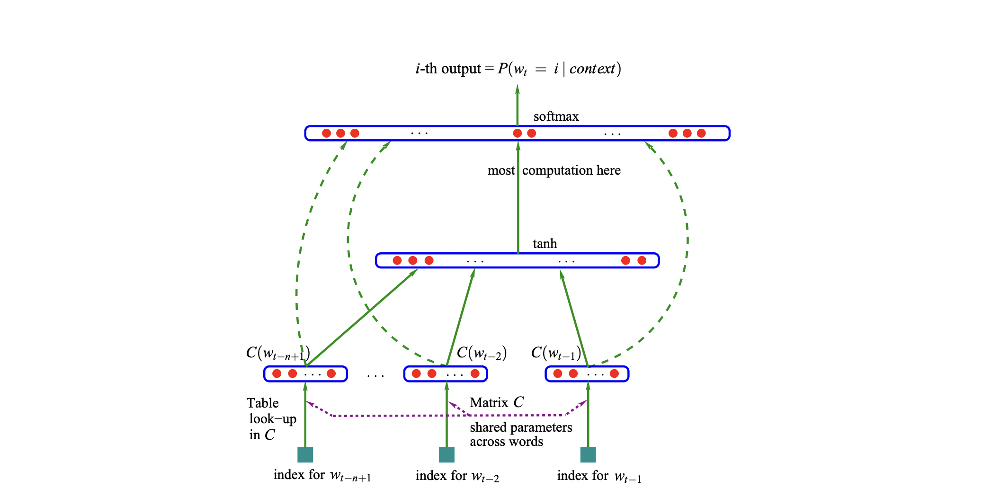

In [245]:
#defining the inner layer, which will have 100 neurons 
W1 = torch.randn([6, 100])  #3*2 is the number of input neurons, 100 is the num of output neurons, 
#hence each row in this matrix represents the weights of a neuron 
b1 = torch.randn(100)  #each neuron in the hidden layer will have a bias and it only makes sense 
#as the activation of a neuron is the sum of the products of weights connected to it from all
#the diff neurons in the previous layers and the input layer neuron's values with sum with a singular
#bias element

In [246]:
#the actual input fed into the hidden layer is the flattened version of the embedding tensor
#hence we need to flatter (32, 3, 2) to (32, 6) to be able to multiply it with the weights
emb_flattened = torch.concat(torch.unbind(emb, dim=1), dim=1)
#torch.unbind frees the tensor from the dimension specified, in this case the second dimension given 
#by 1, and then torch.concat concatenates it along dim 1

In [247]:
emb_flattened.shape

torch.Size([32, 6])

In [248]:
emb_flattened   

tensor([[ 0.9398, -0.0456,  0.9398, -0.0456,  0.9398, -0.0456],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  1.7319,  0.1557],
        [ 0.9398, -0.0456,  1.7319,  0.1557, -2.2849,  0.5546],
        [ 1.7319,  0.1557, -2.2849,  0.5546, -2.2849,  0.5546],
        [-2.2849,  0.5546, -2.2849,  0.5546,  0.8228, -0.0589],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  0.9398, -0.0456],
        [ 0.9398, -0.0456,  0.9398, -0.0456, -0.2972, -1.4933],
        [ 0.9398, -0.0456, -0.2972, -1.4933, -1.0697, -0.4343],
        [-0.2972, -1.4933, -1.0697, -0.4343,  0.7270, -0.8599],
        [-1.0697, -0.4343,  0.7270, -0.8599, -1.8234, -1.0562],
        [ 0.7270, -0.8599, -1.8234, -1.0562,  0.7270, -0.8599],
        [-1.8234, -1.0562,  0.7270, -0.8599,  0.8228, -0.0589],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  0.9398, -0.0456],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  0.8228, -0.0589],
        [ 0.9398, -0.0456,  0.8228, -0.0589, -1.8234, -1.0562],
        [ 0.8228, -0.0589, -1.8234, -1.0

In [249]:
#the same thing can be done using the view method, which just tells torch to reprsent the tensor in a
#different shape, but the underlying data remains the same
emb_flattened = emb.view(-1, 6)  #-1 indicates that the number of rows can be anything as long as the
#number of columns is 6, also it does not create new storage for 
#the tensor, it just changes the way it is represented

In [250]:
emb_flattened

tensor([[ 0.9398, -0.0456,  0.9398, -0.0456,  0.9398, -0.0456],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  1.7319,  0.1557],
        [ 0.9398, -0.0456,  1.7319,  0.1557, -2.2849,  0.5546],
        [ 1.7319,  0.1557, -2.2849,  0.5546, -2.2849,  0.5546],
        [-2.2849,  0.5546, -2.2849,  0.5546,  0.8228, -0.0589],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  0.9398, -0.0456],
        [ 0.9398, -0.0456,  0.9398, -0.0456, -0.2972, -1.4933],
        [ 0.9398, -0.0456, -0.2972, -1.4933, -1.0697, -0.4343],
        [-0.2972, -1.4933, -1.0697, -0.4343,  0.7270, -0.8599],
        [-1.0697, -0.4343,  0.7270, -0.8599, -1.8234, -1.0562],
        [ 0.7270, -0.8599, -1.8234, -1.0562,  0.7270, -0.8599],
        [-1.8234, -1.0562,  0.7270, -0.8599,  0.8228, -0.0589],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  0.9398, -0.0456],
        [ 0.9398, -0.0456,  0.9398, -0.0456,  0.8228, -0.0589],
        [ 0.9398, -0.0456,  0.8228, -0.0589, -1.8234, -1.0562],
        [ 0.8228, -0.0589, -1.8234, -1.0

In [251]:
hidden_layer = torch.tanh(emb.view(-1, 6) @ W1 + b1) 

In [252]:
W2 = torch.randn([100, 27]) #100 is the number of input neurons, 27 is the number of output neurons
b2 = torch.randn(27)

In [253]:
output_layer = hidden_layer @ W2 + b2  #logits
counts = output_layer.exp()

In [254]:
softmax_layer = counts/counts.sum(1, keepdim=True)  #normalizing the logits  
#softmax_layer's neurons now gives the prob of the each of the chars to be occuring next

In [255]:
softmax_layer

tensor([[3.3599e-05, 3.7618e-05, 3.5472e-04, 2.7260e-01, 1.2596e-07, 3.7601e-07,
         1.1270e-08, 3.9222e-08, 2.0696e-10, 2.5017e-04, 6.3470e-08, 8.1521e-05,
         1.7188e-05, 4.6573e-06, 1.5662e-04, 1.7115e-03, 5.5945e-06, 1.8959e-06,
         3.0603e-06, 1.5593e-08, 7.2321e-01, 1.4966e-11, 6.3653e-05, 5.6583e-05,
         3.9990e-07, 5.8873e-05, 1.3466e-03],
        [4.1539e-08, 9.6069e-05, 7.8927e-07, 2.7784e-02, 5.4880e-07, 5.5821e-06,
         6.7205e-11, 4.5807e-09, 1.0630e-10, 9.0026e-06, 9.0969e-10, 1.0314e-06,
         1.7564e-09, 9.5622e-09, 6.4301e-06, 8.2158e-04, 1.8543e-08, 2.1791e-11,
         1.3904e-05, 4.0021e-08, 9.6844e-01, 1.7256e-10, 2.3896e-04, 8.6036e-07,
         1.6089e-07, 8.1790e-09, 2.5841e-03],
        [1.1417e-01, 1.3628e-08, 4.7067e-01, 1.7299e-09, 2.4681e-10, 3.1874e-10,
         8.7321e-08, 3.2732e-12, 2.0346e-14, 2.2168e-05, 2.6582e-06, 3.6180e-01,
         1.0457e-02, 3.5778e-10, 3.4759e-09, 9.1384e-11, 3.3453e-02, 9.4210e-03,
         3.0370e-

In [256]:
Y

tensor([ 5, 13, 13,  1,  0, 15, 12,  9, 22,  9,  1,  0,  1, 22,  1,  0,  9, 19,
         1,  2,  5, 12, 12,  1,  0, 19, 15, 16,  8,  9,  1,  0])

In [257]:
#neg log loss
nll = -softmax_layer[torch.arange(Y.shape[0]), Y].log().mean()

In [258]:
nll

tensor(16.1296)

In [259]:
#now this was all the examples for what shld be done, now doing it formally

#one more thing to point is that we dont really need to make a softmax layer, as its 
#only ever needed to find the loss and can help with visualistion of each of the chars
#occurring, so instead we can do F.cross_entropy(logits, Y) where logits is the direct
#output from the output layer wihout the softmax layer and Y is the actual tagret tensor

#using F.cross_entropy() is also better as it offsets the values of the logits 
#to let the highest value be 0, so that the exp of the logits does not explode
#so if we had [1, 2, -3, 100], normally e^100 would be inf here, but cross_entropy
#internally makes it [-99, -98, -103, 0] so that the exp of the logits does not explode
#and also the softmax remains the same as the offset is same for all the values

In [356]:
#doing it fresh
block_size = 3

def build_dataset(words):
    X, Y = [], []
    for w in words:
        context = [0] * block_size
        for ch in (w+'.'):
            ix = atoi[ch]
            X.append(context)
            Y.append(ix)
            context = context[1:] + [ix]
    X = torch.tensor(X)
    Y = torch.tensor(Y)

    return X, Y

import random
random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words))   #splitting of the datset of words, then from those split datasets we make the dataset for our use
n2 = int(0.9*len(words))

Xtr, Ytr = build_dataset(words[:n1])

Xval, Yval = build_dataset(words[n1:n2])

Xte, Yte = build_dataset(words[n2:])

In [357]:
Xtr.shape, Ytr.shape

(torch.Size([182625, 3]), torch.Size([182625]))

In [363]:
g = torch.Generator().manual_seed(2147483647)

In [364]:
C = torch.randn([27, 10], generator=g, requires_grad=True)  #the lookup matrix for the chars is differetiable too 
#bow representing the char embeddings in 10 dimesion so that each of the chars can be represented properly
W1 = torch.randn([30, 200], generator=g, requires_grad=True)
b1 = torch.rand(200, generator=g, requires_grad=True)
W2 = torch.randn([200, 27], generator=g, requires_grad=True)
b2 = torch.rand(27, generator=g, requires_grad=True)
parameters = [C, W1, b1, W2, b2]

In [365]:
#num of params to be tuned in the model
sum(p.nelement() for p in parameters)

11897

In [366]:
import torch.nn.functional as F

In [367]:
#gradient descent step
for _ in range(200000):
    #minibatch of 32 batches selected randomly
    ix = torch.randint(0, Xtr.shape[0], [32])   #selecting 32 random indices from the dataset, now doing this 
    #does reduce the quality of the graient, since the model might not be able to use the entire dataset over the 
    #span of all the epochs, but we take faster steps in doing so as opposed to having better
    # quality gradients and taking slower step, hence in practice, minibatch GD is used 
    #instead of full batch GD

    #its much faster as the update is done only for batched of 32 as opposed to that of the entire dataset all for 1000 times over
    #also here we see that the gradients bounce about a lot going from higher to lower and vice versa many times over
    #and this is just a testament to the fact that the gradients are not of the best quality, but the model still learns,
    #the steps taken in the direction of local minima are kind of random, bouncing about a lot, but its faster and does
    #still eventually learn by reaching the local minima

    #forawrd pass
    emb = C[Xtr[ix]]     #embedding the context
    h = torch.tanh(emb.view(-1, W1.shape[0]) @ W1 + b1)
    logits = h @ W2 + b2
    nll = F.cross_entropy(logits, Ytr[ix])
    print(f"loss at epoch {_+1}: {nll.item()}")   #loss for just that minibatch
    
    #backward pass
    #setting all the params grads to 0 before backpropagating
    for p in parameters:
        p.grad = None
    nll.backward()  #backpropagating the loss

    #update the parameters
    lr = 0.1 if _ <100000 else 0.01
    for p in parameters: 
        p.data += -lr * p.grad

# print(nll)

loss at epoch 1: 22.46454620361328
loss at epoch 2: 25.331363677978516
loss at epoch 3: 23.670724868774414
loss at epoch 4: 25.539413452148438
loss at epoch 5: 23.321529388427734
loss at epoch 6: 21.693307876586914
loss at epoch 7: 26.776174545288086
loss at epoch 8: 18.38044548034668
loss at epoch 9: 23.029088973999023
loss at epoch 10: 22.567731857299805
loss at epoch 11: 18.903398513793945
loss at epoch 12: 21.119701385498047
loss at epoch 13: 18.694889068603516
loss at epoch 14: 21.381553649902344
loss at epoch 15: 17.751789093017578
loss at epoch 16: 17.20989418029785
loss at epoch 17: 20.421428680419922
loss at epoch 18: 18.924562454223633
loss at epoch 19: 21.35059928894043
loss at epoch 20: 17.53523826599121
loss at epoch 21: 17.975933074951172
loss at epoch 22: 16.71379852294922
loss at epoch 23: 13.460468292236328
loss at epoch 24: 14.149879455566406
loss at epoch 25: 19.030376434326172
loss at epoch 26: 15.795220375061035
loss at epoch 27: 13.886689186096191
loss at epoch 28

In [368]:
#computing the loss over the testing set
emb = C[Xte]
h = torch.tanh(emb.view(-1, W1.shape[0]) @ W1 + b1)
logits = h @ W2 + b2
nll = F.cross_entropy(logits, Yte)
print(nll)

tensor(2.1636, grad_fn=<NllLossBackward0>)


In [369]:
#over validation set
emb = C[Xval]
h = torch.tanh(emb.view(-1, W1.shape[0]) @ W1 + b1)
logits = h @ W2 + b2
nll = F.cross_entropy(logits, Yval)
print(nll)

tensor(2.1659, grad_fn=<NllLossBackward0>)


In [268]:
#we also ideally use three splits of the dataset, 
#training, validatiom/dev, testing

#where validation set is used to tune the hyperparameters of the model, like learning rate, number of weights in a layer etc 

#test set is used to find the final loss on new dataset and also to see what it predicts on new data

In [269]:
#a possible bottleneck to the models performance could be the number of dimensions used for embedding space, if its 
#too low, we are fitting in too much context in a low vector space so each of the chars are not properly 
#defined hence the model is not able to distinguish bw the chars and efficient training does not occur, so increasing the
#dim of the vector space could help

In [370]:
#sampling from the model
g = torch.Generator().manual_seed(2147483647 + 10)

for _ in range(20):
    out = []
    context = [0]*block_size   #init with ...

    while True:
        emb = C[torch.tensor([context])]  #embedding vector corresponding to those three chars obtained
        h = torch.tanh(emb.view(1, -1) @ W1 + b1)
        logits = h @ W2 + b2
        probs = F.softmax(logits, dim=1)
        
        ix = torch.multinomial(probs, num_samples=1, generator=g).item()
        context = context[1:] + [ix]
        out.append(ix)
        if ix==0:
            break
    
    print(''.join(itoa[i] for i in out))

carman.
aab.
hari.
kimri.
reviyah.
cassie.
rahnelferlynn.
jareen.
nellara.
chaiivia.
leigh.
ham.
jorn.
quinn.
sulin.
alian.
quince.
madiarisi.
jaxen.
ivuan.


In [ ]:
#now its much more namelike